# Excercise 1
I don't think there is much that needs to be written by me as for the functions and their plots in this document. Each function has a heading for better navigation in outline.

Cells below take care of imports and then two helper functions, once to calculate Z axis values and another one to display a plot. The resolution arguments tells numpy how many values for X and Y axis should be generated in the specified range. The algorithms themselves are converted from their math representation into a Python one.

### Blind search
*Not implemented*

In [2]:
import numpy as np
import plotly.graph_objects as go
from typing import Callable
import math

In [3]:
def generate_z_data(func: Callable[[list], float], x_range: tuple[float, float], resolution: int = 200) -> dict[str, np.ndarray] :
    x = y = np.linspace(x_range[0], x_range[1], resolution)
    # took me a while to understand this function, found someone using it on stack overflow
    # i simply love it now
    X, Y = np.meshgrid(x, y)
    Z = func([X, Y])
    return {"x": X, "y": Y, "z": Z}

def generate_plot(*args, **kwargs):
    fig = go.Figure(data=[go.Surface(*args, **kwargs)])
    return fig.show()

## Sphere function

In [4]:
def sphere_function(numbers: list) -> float:
    return sum(x**2 for x in numbers)

result = generate_z_data(sphere_function, (-5.12, 5.12))
generate_plot(**result)

## Schwefel function

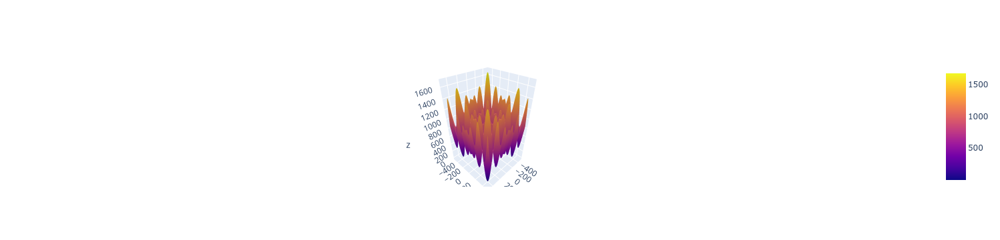

In [5]:
def schwefel_function(numbers: list) -> float:
    return 418.9829 * len(numbers) - sum(x * np.sin(np.sqrt(np.abs(x))) for x in numbers)

result = generate_z_data(schwefel_function, (-500, 500))
generate_plot(**result)

## Rosenbrock function

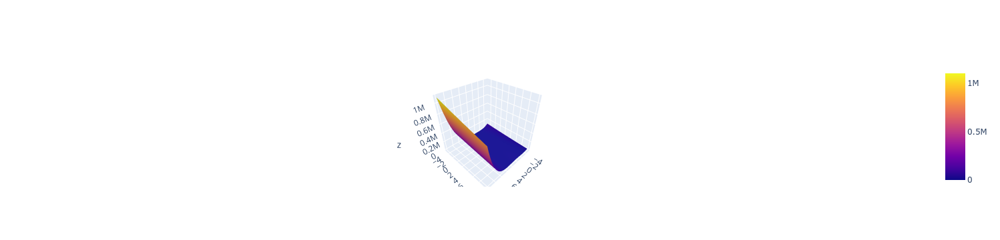

In [6]:
def rosenbrock_function(numbers: list) -> float:
    total = 0
    for i in range(len(numbers) - 1):
        total += 100 * (numbers[i + 1] - numbers[i]**2)**2 + (numbers[i] - 1)**2
    return total

result = generate_z_data(rosenbrock_function, (-5, 10))
generate_plot(**result)

## Rastrigin function

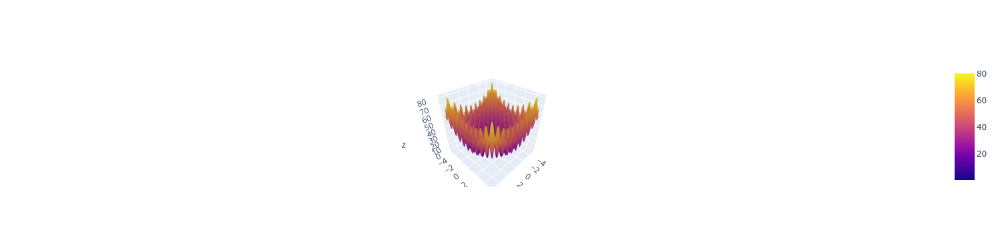

In [7]:
def rastrigin_function(numbers: list) -> float:
    return 10 * len(numbers) + sum((x**2) - 10 * np.cos(2 * math.pi * x) for x in numbers)


result = generate_z_data(rastrigin_function, (-5.12, 5.12))
generate_plot(**result)

## Griewank function

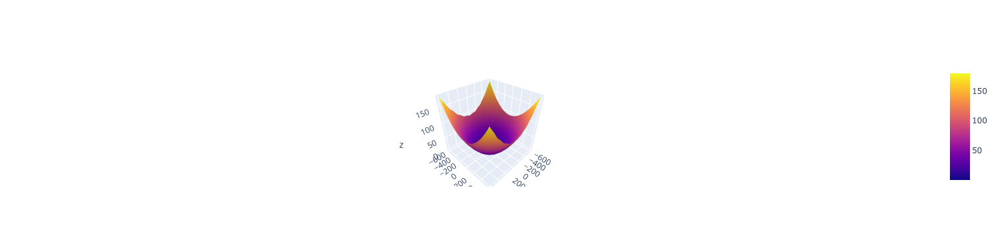

In [8]:
def griewank_function(numbers: list) -> float:
    return sum((number**2) / 4000 for number in numbers) - math.prod(np.cos(x / math.sqrt(i)) for i, x in enumerate(numbers, 1)) + 1

result = generate_z_data(griewank_function, (-600, 600))
generate_plot(**result)

## Levy function

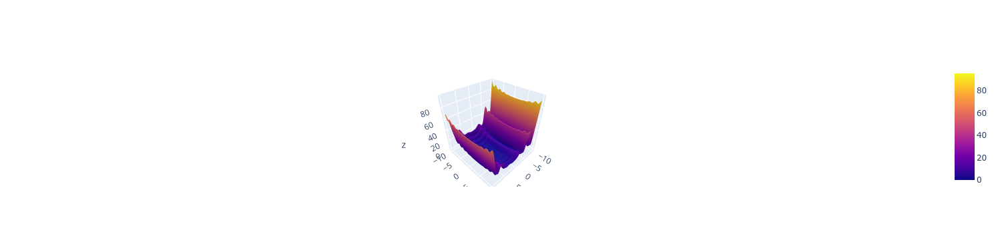

In [9]:
# why is this one so long
def levy_function(numbers: list) -> float:
    w_values = [1 + (x - 1) / 4 for x in numbers]
    return np.sin(math.pi * w_values[0])**2 + sum(
        (w - 1)**2 * (1 + 10 * np.sin(math.pi * w + 1)**2) for w in w_values[:-1]
    ) + (w_values[-1] - 1)**2 * (1 + np.sin(2 * math.pi * w_values[-1])**2)

result = generate_z_data(levy_function, (-10, 10))
generate_plot(**result)

## Michalewicz function

In [10]:
def michalewicz_function(numbers: list) -> float:
    m = 10
    return -sum(np.sin(x) * np.sin((i * x**2) / math.pi)**m for i, x in enumerate(numbers, 1))

result = generate_z_data(michalewicz_function, (0, math.pi))
generate_plot(**result)

## Zakharov function

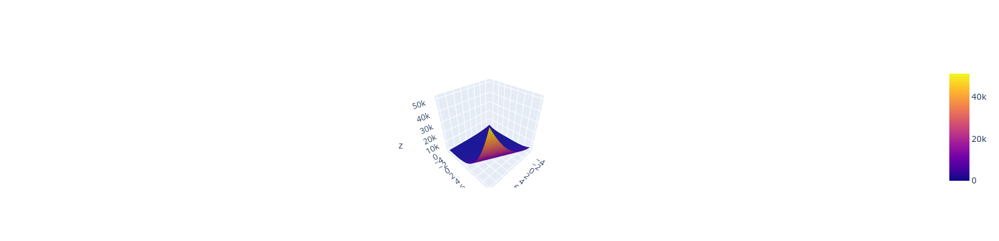

In [11]:
def zakharov_function(numbers: list) -> float:
    intermediary = sum(0.5 * i * x for i, x in enumerate(numbers, 1))
    return sum(x**2 for x in numbers) + intermediary**2 + intermediary**4

result = generate_z_data(zakharov_function, (-5, 10))
generate_plot(**result)

## Ackley function

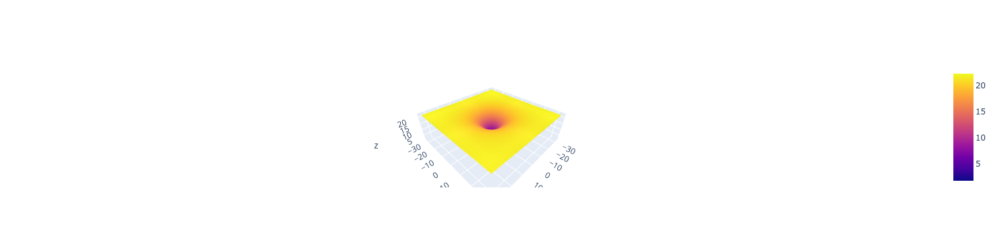

In [12]:
def ackley_function(numbers: list) -> float:
    a = 20
    b = .2
    c = 2 * math.pi
    d = len(numbers)
    return -a * np.exp(
        -b * np.sqrt(1 / d * sum(x**2 for x in numbers))
    ) - np.exp(
        1 / d * sum(np.cos(c * x) for x in numbers)
    ) + a + math.exp(1)

result = generate_z_data(ackley_function, (-32.768, 32.768))
generate_plot(**result)